In [0]:
import os

# helper libraries
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.ion()   # interactive mode

# pytorch libraries
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import transforms, datasets
from torch.utils.data import DataLoader

In [0]:
# Size of z latent vector
num_z = 100

# Size of feature maps in generator
num_feat_gen = 64

# Size of feature maps in disciminator
num_feat_disc = 64

# number of channels in input image
num_channels = 3

image_size = 64

batch_size = 128

# learning rate
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# device to train the model on
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")


In [0]:
class Generator(nn.Module):

    def __init__(self):
        super(Generator, self).__init__()
        self.generator = nn.Sequential(
            nn.ConvTranspose2d(in_channels=num_z, out_channels=num_feat_gen*8, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(num_feat_gen*8),
            nn.ReLU(True),

            nn.ConvTranspose2d(in_channels=num_feat_gen*8, out_channels=num_feat_gen*4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(num_feat_gen*4),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=num_feat_gen*4, out_channels=num_feat_gen*2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(num_feat_gen*2),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=num_feat_gen*2, out_channels=num_feat_gen, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(num_feat_gen),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=num_feat_gen, out_channels=num_channels, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )
    
    def forward(self, input):
        return self.generator(input)


In [0]:
class Discriminator(nn.Module):

    def __init__(self):
        super(Discriminator, self).__init__()
        self.discriminator = nn.Sequential(
            nn.Conv2d(in_channels=num_channels, out_channels=num_feat_disc, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),

            nn.Conv2d(in_channels=num_feat_disc, out_channels=num_feat_disc*2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(num_features=num_feat_disc*2),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),

            nn.Conv2d(in_channels=num_feat_disc*2, out_channels=num_feat_disc*4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(num_features=num_feat_disc*4),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),

            nn.Conv2d(in_channels=num_feat_disc*4, out_channels=num_feat_disc*8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(num_features=num_feat_disc*8),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),

            nn.Conv2d(in_channels=num_feat_disc*8, out_channels=1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
        )
    
    def forward(self, input):
        return self.discriminator(input)


In [0]:
# custom weights initialization called on generator and discriminator
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import os
os.listdir('drive/My Drive/dl_data/')

['img_align_celeba.zip',
 'fer2013',
 'Amex-challenge',
 'rough-sketch-simplification',
 'celeba']

In [0]:
! mkdir -p celeba
! unzip drive/My\ Drive/dl_data/img_align_celeba.zip -d celeba/

In [0]:
root = 'celeba/'

In [0]:
# Create the dataset
dataset = datasets.ImageFolder(root=root,
                              transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=4)

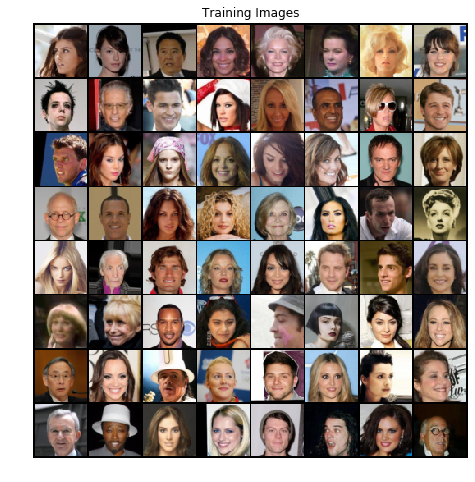

In [0]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(torchvision.utils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [0]:
gen = Generator().to(device)
disc = Discriminator().to(device)

gen.apply(weights_init)
disc.apply(weights_init)

print (gen)
print (disc)

Generator(
  (generator): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
 

In [0]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
# the progression of the generator
fixed_noise = torch.randn(64, num_z, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(disc.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(gen.parameters(), lr=lr, betas=(beta1, 0.999))

In [0]:
def train(num_epochs, nz, dataloader, netG, netD, device, optimizerG, optimizerD):
    # Training Loop

    # Lists to keep track of progress
    img_list = []
    G_losses = []
    D_losses = []
    iters = 0

    print("Starting Training Loop...")
    # For each epoch
    for epoch in range(num_epochs):
        # For each batch in the dataloader
        for i, data in enumerate(dataloader, 0):

            ############################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            ###########################
            ## Train with all-real batch
            netD.zero_grad()
            # Format batch
            real_cpu = data[0].to(device)
            b_size = real_cpu.size(0)
            label = torch.full((b_size,), real_label, device=device)
            # Forward pass real batch through D
            output = netD(real_cpu).view(-1)
            # Calculate loss on all-real batch
            errD_real = criterion(output, label)
            # Calculate gradients for D in backward pass
            errD_real.backward()
            D_x = output.mean().item()

            ## Train with all-fake batch
            # Generate batch of latent vectors
            noise = torch.randn(b_size, nz, 1, 1, device=device)
            # Generate fake image batch with G
            fake = netG(noise)
            label.fill_(fake_label)
            # Classify all fake batch with D
            output = netD(fake.detach()).view(-1)
            # Calculate D's loss on the all-fake batch
            errD_fake = criterion(output, label)
            # Calculate the gradients for this batch
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            # Add the gradients from the all-real and all-fake batches
            errD = errD_real + errD_fake
            # Update D
            optimizerD.step()

            ############################
            # (2) Update G network: maximize log(D(G(z)))
            ###########################
            netG.zero_grad()
            label.fill_(real_label)  # fake labels are real for generator cost
            # Since we just updated D, perform another forward pass of all-fake batch through D
            output = netD(fake).view(-1)
            # Calculate G's loss based on this output
            errG = criterion(output, label)
            # Calculate gradients for G
            errG.backward()
            D_G_z2 = output.mean().item()
            # Update G
            optimizerG.step()

            # Output training stats
            if i % 50 == 0:
                print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                    % (epoch, num_epochs, i, len(dataloader),
                        errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

            # Save Losses for plotting later
            G_losses.append(errG.item())
            D_losses.append(errD.item())

            # Check how the generator is doing by saving G's output on fixed_noise
            if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
                with torch.no_grad():
                    fake = netG(fixed_noise).detach().cpu()
                img_list.append(torchvision.utils.make_grid(fake, padding=2, normalize=True))

            iters += 1
    return G_losses, D_losses, img_list

In [0]:
G_losses, D_losses, img_list = train(5, num_z, dataloader, gen, disc, device, optimizerG, optimizerD)

Starting Training Loop...
[0/5][0/1583]	Loss_D: 1.5486	Loss_G: 3.5042	D(x): 0.4049	D(G(z)): 0.3452 / 0.0448
[0/5][50/1583]	Loss_D: 0.0802	Loss_G: 26.8690	D(x): 0.9733	D(G(z)): 0.0000 / 0.0000
[0/5][100/1583]	Loss_D: 0.7270	Loss_G: 8.6256	D(x): 0.7214	D(G(z)): 0.0015 / 0.0039
[0/5][150/1583]	Loss_D: 0.4609	Loss_G: 5.1627	D(x): 0.8568	D(G(z)): 0.1765 / 0.0129
[0/5][200/1583]	Loss_D: 0.4705	Loss_G: 5.6507	D(x): 0.8424	D(G(z)): 0.1833 / 0.0064
[0/5][250/1583]	Loss_D: 0.5782	Loss_G: 5.6392	D(x): 0.7561	D(G(z)): 0.1625 / 0.0073
[0/5][300/1583]	Loss_D: 1.1183	Loss_G: 9.1675	D(x): 0.9199	D(G(z)): 0.5406 / 0.0006
[0/5][350/1583]	Loss_D: 0.5268	Loss_G: 4.4775	D(x): 0.9289	D(G(z)): 0.3104 / 0.0210
[0/5][400/1583]	Loss_D: 0.5238	Loss_G: 3.4341	D(x): 0.7234	D(G(z)): 0.0846 / 0.0540
[0/5][450/1583]	Loss_D: 0.4957	Loss_G: 6.2225	D(x): 0.8945	D(G(z)): 0.2771 / 0.0044
[0/5][500/1583]	Loss_D: 0.3499	Loss_G: 4.3360	D(x): 0.8490	D(G(z)): 0.1210 / 0.0240
[0/5][550/1583]	Loss_D: 0.7071	Loss_G: 7.1095	D(x): 

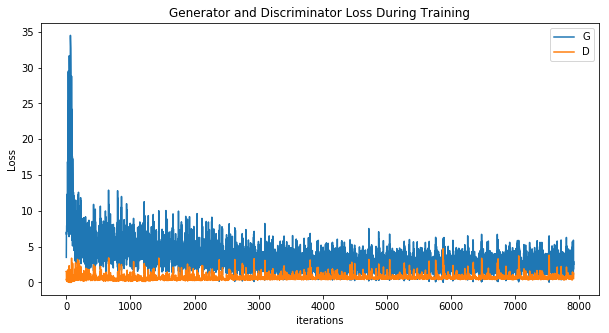

In [0]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

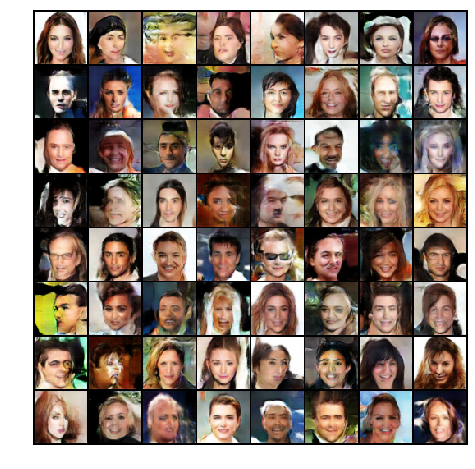

In [0]:
#%%capture
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

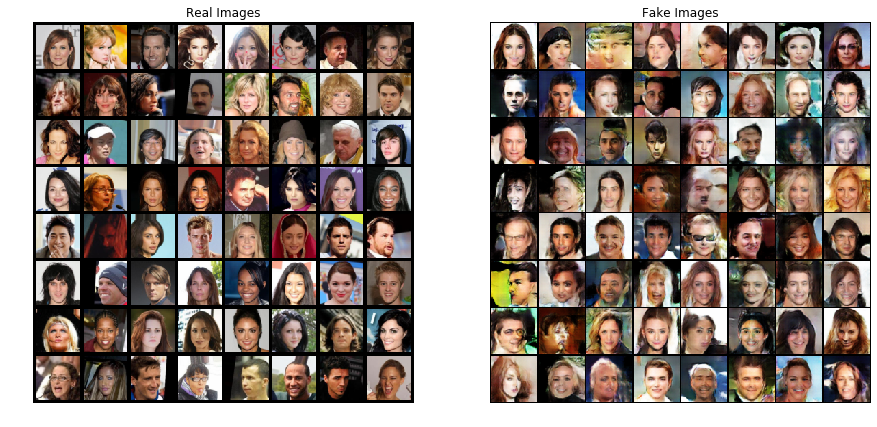

In [0]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(torchvision.utils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()